# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [201]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

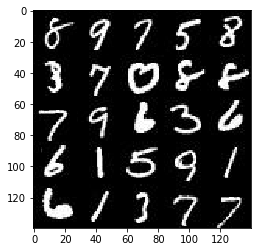

In [202]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

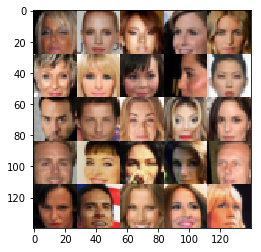

In [203]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [204]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


/home/sunggeun/anaconda2/envs/tensorflow/lib/python3.5/site-packages/ipykernel/__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [205]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function

    return tf.placeholder(tf.float32,(None, image_width, image_height, image_channels), name="real_input"),\
           tf.placeholder(tf.float32,(None, z_dim), name="z_input"),\
           tf.placeholder(tf.float32,(), name="learning_rate")


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [200]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        
        #first convolution layer
        l1 = tf.layers.conv2d(images, 32, 5, strides=2, padding='same', \
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(0.1 * l1, l1)
        do1 = tf.nn.dropout(relu1, keep_prob=0.7)
        
        #second convolution layer
        l2 = tf.layers.conv2d(do1, 64, 5, strides=2, padding='same', \
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(l2, training=True)
        relu2 = tf.maximum(0.1 * bn2, bn2)
        do2 = tf.nn.dropout(relu2, keep_prob=0.7)
        
        #third convolution layer
        l3 = tf.layers.conv2d(do2, 128, 5, strides=2, padding='same', \
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(l3, training=True)
        relu3 = tf.maximum(0.1 * bn3, bn3)
        do3 = tf.nn.dropout(relu3, keep_prob=0.7)
        
        #third convolution layer
        l4 = tf.layers.conv2d(do3, 256, 5, strides=2, padding='same', \
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn4 = tf.layers.batch_normalization(l4, training=True)
        relu4 = tf.maximum(0.1 * bn4, bn4)
        do4 = tf.nn.dropout(relu4, keep_prob=0.7)
        
        #flatten
        flatten = tf.reshape(do4, (-1, 2*2*256))
        
        #logit
        logit = tf.layers.dense(flatten, 1)
        
        #output
        output = tf.sigmoid(logit)
        
    return output, logit


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [207]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    with tf.variable_scope("generator", reuse = not is_train):
        #fully connected layer
        f1 = tf.layers.dense(z, 4*4*512)

        r1 = tf.reshape(f1, (-1, 4, 4, 512))
        bn1 = tf.layers.batch_normalization(r1, training=is_train)
        relu1 = tf.maximum(0.1 * bn1, bn1)
        do1 = tf.nn.dropout(relu1, keep_prob=0.7)

        # deconvolution layer
        d2 = tf.layers.conv2d_transpose(do1, 128, 4, strides=1, padding='valid', \
                                  kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(d2, training=is_train)
        relu2 = tf.maximum(0.1 * bn2, bn2)
        do2 = tf.nn.dropout(relu2, keep_prob=0.7)

        # deconvolution layer
        d3 = tf.layers.conv2d_transpose(do2, 64, 5, strides=2, padding='same', \
                                  kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(d3, training=is_train)
        relu3 = tf.maximum(0.1 * bn3, bn3)
        do3 = tf.nn.dropout(relu3, keep_prob=0.7)

        # deconvolution layer
        d4 = tf.layers.conv2d_transpose(do3, 32, 5, strides=2, padding='same', \
                                  kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn4 = tf.layers.batch_normalization(d4, training=is_train)
        relu4 = tf.maximum(0.1 * bn4, bn4)
        do4 = tf.nn.dropout(relu4, keep_prob=0.7)

        #logit
        logit = tf.layers.conv2d_transpose(do4, out_channel_dim, 3, strides=1, padding='same',\
                                            kernel_initializer = tf.contrib.layers.xavier_initializer())

        #output
        output = tf.tanh(logit)
    
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [208]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim)    
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,\
                                                labels=tf.ones_like(d_logits_real) * 0.9))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,\
                                                labels=tf.zeros_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,\
                                                labels=tf.ones_like(d_logits_fake)))
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [209]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='generator')):
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [210]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [211]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    out_channel_dim = 1 if data_image_mode == "L" else 3
    image_width = data_shape[1]
    image_height = data_shape[2]
    image_channels = data_shape[3]
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    step = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                batch_images = batch_images * 2
                
                step += 1
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z, lr:learning_rate})
            
            
                if step % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = sess.run(d_loss, {input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))

                if step % 100 == 0:
                    show_generator_output(sess, 50, input_z, image_channels, data_image_mode)           
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.6250... Generator Loss: 1.9366
Epoch 1/2... Discriminator Loss: 0.5700... Generator Loss: 2.9537
Epoch 1/2... Discriminator Loss: 0.5942... Generator Loss: 3.7413
Epoch 1/2... Discriminator Loss: 0.5377... Generator Loss: 2.7468
Epoch 1/2... Discriminator Loss: 0.4614... Generator Loss: 4.5407
Epoch 1/2... Discriminator Loss: 3.2902... Generator Loss: 0.1381
Epoch 1/2... Discriminator Loss: 1.6027... Generator Loss: 3.0852
Epoch 1/2... Discriminator Loss: 0.9666... Generator Loss: 2.2109
Epoch 1/2... Discriminator Loss: 1.0302... Generator Loss: 1.3398
Epoch 1/2... Discriminator Loss: 0.8112... Generator Loss: 2.2412


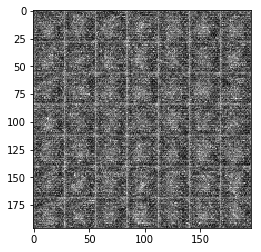

Epoch 1/2... Discriminator Loss: 0.6724... Generator Loss: 2.5229
Epoch 1/2... Discriminator Loss: 0.8692... Generator Loss: 2.3558
Epoch 1/2... Discriminator Loss: 0.6669... Generator Loss: 1.8757
Epoch 1/2... Discriminator Loss: 0.4352... Generator Loss: 3.5119
Epoch 1/2... Discriminator Loss: 0.7016... Generator Loss: 1.8253
Epoch 1/2... Discriminator Loss: 1.2128... Generator Loss: 3.2379
Epoch 1/2... Discriminator Loss: 0.7263... Generator Loss: 2.0428
Epoch 1/2... Discriminator Loss: 0.7417... Generator Loss: 1.9337
Epoch 1/2... Discriminator Loss: 1.1052... Generator Loss: 0.8422
Epoch 1/2... Discriminator Loss: 0.7915... Generator Loss: 1.9872


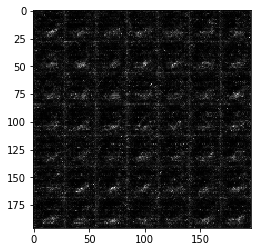

Epoch 1/2... Discriminator Loss: 1.0316... Generator Loss: 1.8866
Epoch 1/2... Discriminator Loss: 1.1527... Generator Loss: 1.2775
Epoch 1/2... Discriminator Loss: 1.0497... Generator Loss: 0.9867
Epoch 1/2... Discriminator Loss: 1.0883... Generator Loss: 2.0180
Epoch 1/2... Discriminator Loss: 0.7028... Generator Loss: 1.9041
Epoch 1/2... Discriminator Loss: 0.7442... Generator Loss: 2.0871
Epoch 1/2... Discriminator Loss: 0.6663... Generator Loss: 1.8542
Epoch 1/2... Discriminator Loss: 0.8558... Generator Loss: 1.1347
Epoch 1/2... Discriminator Loss: 0.7516... Generator Loss: 1.8814
Epoch 1/2... Discriminator Loss: 0.8569... Generator Loss: 1.8879


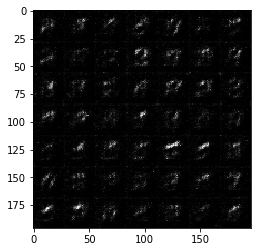

Epoch 1/2... Discriminator Loss: 0.8785... Generator Loss: 1.1621
Epoch 1/2... Discriminator Loss: 1.1733... Generator Loss: 0.8626
Epoch 1/2... Discriminator Loss: 1.0819... Generator Loss: 1.5227
Epoch 1/2... Discriminator Loss: 1.0612... Generator Loss: 1.0798
Epoch 1/2... Discriminator Loss: 0.9037... Generator Loss: 1.9509
Epoch 1/2... Discriminator Loss: 0.9737... Generator Loss: 1.9099
Epoch 1/2... Discriminator Loss: 1.0007... Generator Loss: 0.8889
Epoch 1/2... Discriminator Loss: 0.9843... Generator Loss: 1.1640
Epoch 1/2... Discriminator Loss: 1.1942... Generator Loss: 0.6690
Epoch 1/2... Discriminator Loss: 1.1369... Generator Loss: 1.2225


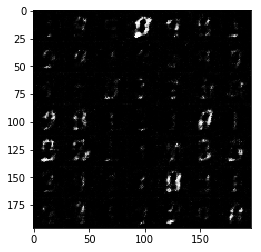

Epoch 1/2... Discriminator Loss: 1.1305... Generator Loss: 0.6389
Epoch 1/2... Discriminator Loss: 1.0255... Generator Loss: 1.9942
Epoch 1/2... Discriminator Loss: 0.9405... Generator Loss: 1.9856
Epoch 1/2... Discriminator Loss: 0.9261... Generator Loss: 1.3561
Epoch 1/2... Discriminator Loss: 0.9020... Generator Loss: 1.0266
Epoch 1/2... Discriminator Loss: 1.1836... Generator Loss: 0.9420
Epoch 1/2... Discriminator Loss: 0.7440... Generator Loss: 1.2269
Epoch 1/2... Discriminator Loss: 1.4660... Generator Loss: 2.7039
Epoch 1/2... Discriminator Loss: 0.7633... Generator Loss: 1.4245
Epoch 1/2... Discriminator Loss: 1.1625... Generator Loss: 2.6127


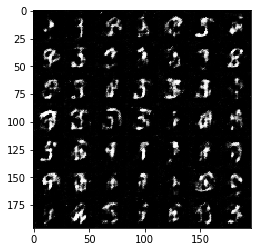

Epoch 1/2... Discriminator Loss: 0.9318... Generator Loss: 2.2091
Epoch 1/2... Discriminator Loss: 1.5126... Generator Loss: 0.5309
Epoch 1/2... Discriminator Loss: 0.9599... Generator Loss: 1.2004
Epoch 1/2... Discriminator Loss: 2.0648... Generator Loss: 0.2133
Epoch 1/2... Discriminator Loss: 1.1013... Generator Loss: 0.6829
Epoch 1/2... Discriminator Loss: 0.8469... Generator Loss: 1.0939
Epoch 1/2... Discriminator Loss: 0.9766... Generator Loss: 1.2283
Epoch 1/2... Discriminator Loss: 0.7590... Generator Loss: 1.1560
Epoch 1/2... Discriminator Loss: 0.8229... Generator Loss: 0.8667
Epoch 1/2... Discriminator Loss: 0.9593... Generator Loss: 2.1263


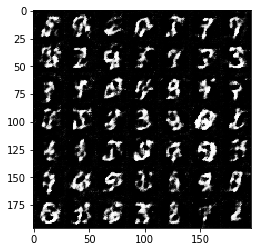

Epoch 1/2... Discriminator Loss: 1.0029... Generator Loss: 1.3764
Epoch 1/2... Discriminator Loss: 1.0844... Generator Loss: 1.0371
Epoch 1/2... Discriminator Loss: 1.0226... Generator Loss: 2.2973
Epoch 1/2... Discriminator Loss: 0.9331... Generator Loss: 1.7088
Epoch 1/2... Discriminator Loss: 0.8262... Generator Loss: 1.4417
Epoch 1/2... Discriminator Loss: 0.9963... Generator Loss: 0.7032
Epoch 1/2... Discriminator Loss: 0.8906... Generator Loss: 1.7564
Epoch 1/2... Discriminator Loss: 1.2203... Generator Loss: 2.0053
Epoch 1/2... Discriminator Loss: 1.1654... Generator Loss: 2.9811
Epoch 1/2... Discriminator Loss: 0.8354... Generator Loss: 1.4961


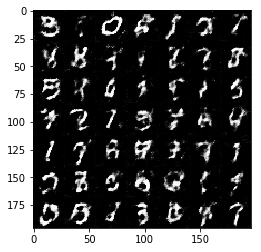

Epoch 1/2... Discriminator Loss: 0.9168... Generator Loss: 1.1422
Epoch 1/2... Discriminator Loss: 1.1642... Generator Loss: 0.6733
Epoch 1/2... Discriminator Loss: 0.9076... Generator Loss: 1.0604
Epoch 1/2... Discriminator Loss: 1.0832... Generator Loss: 0.9206
Epoch 1/2... Discriminator Loss: 0.8496... Generator Loss: 1.2050
Epoch 1/2... Discriminator Loss: 1.1476... Generator Loss: 2.4745
Epoch 1/2... Discriminator Loss: 1.0026... Generator Loss: 1.1636
Epoch 1/2... Discriminator Loss: 1.1121... Generator Loss: 1.7627
Epoch 1/2... Discriminator Loss: 0.9187... Generator Loss: 1.0220
Epoch 1/2... Discriminator Loss: 1.1174... Generator Loss: 1.3326


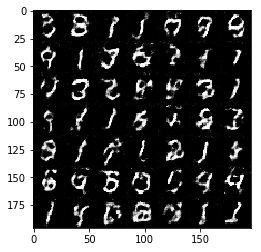

Epoch 1/2... Discriminator Loss: 1.3088... Generator Loss: 2.4966
Epoch 1/2... Discriminator Loss: 1.1830... Generator Loss: 1.7676
Epoch 1/2... Discriminator Loss: 1.2897... Generator Loss: 0.7217
Epoch 1/2... Discriminator Loss: 1.0494... Generator Loss: 1.7928
Epoch 1/2... Discriminator Loss: 0.9859... Generator Loss: 1.2672
Epoch 1/2... Discriminator Loss: 1.3811... Generator Loss: 0.7439
Epoch 1/2... Discriminator Loss: 0.8589... Generator Loss: 1.2015
Epoch 1/2... Discriminator Loss: 1.1158... Generator Loss: 1.2168
Epoch 1/2... Discriminator Loss: 1.3969... Generator Loss: 0.8150
Epoch 1/2... Discriminator Loss: 0.9155... Generator Loss: 1.4546


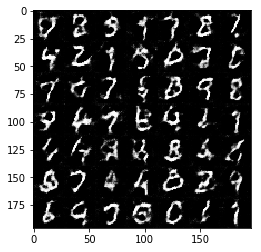

Epoch 1/2... Discriminator Loss: 1.5341... Generator Loss: 0.6447
Epoch 1/2... Discriminator Loss: 0.9525... Generator Loss: 1.0720
Epoch 1/2... Discriminator Loss: 1.1272... Generator Loss: 1.9601
Epoch 2/2... Discriminator Loss: 1.3882... Generator Loss: 0.6214
Epoch 2/2... Discriminator Loss: 0.9314... Generator Loss: 2.0995
Epoch 2/2... Discriminator Loss: 1.3570... Generator Loss: 0.5455
Epoch 2/2... Discriminator Loss: 1.0522... Generator Loss: 2.0381
Epoch 2/2... Discriminator Loss: 1.0019... Generator Loss: 1.3897
Epoch 2/2... Discriminator Loss: 1.3252... Generator Loss: 0.5186
Epoch 2/2... Discriminator Loss: 1.1511... Generator Loss: 1.2027


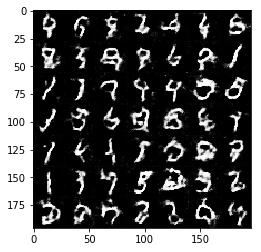

Epoch 2/2... Discriminator Loss: 0.9795... Generator Loss: 2.2223
Epoch 2/2... Discriminator Loss: 0.8905... Generator Loss: 1.3775
Epoch 2/2... Discriminator Loss: 1.1136... Generator Loss: 0.7878
Epoch 2/2... Discriminator Loss: 1.0919... Generator Loss: 0.5524
Epoch 2/2... Discriminator Loss: 1.1279... Generator Loss: 1.2298
Epoch 2/2... Discriminator Loss: 0.8456... Generator Loss: 1.1638
Epoch 2/2... Discriminator Loss: 1.0401... Generator Loss: 0.8318
Epoch 2/2... Discriminator Loss: 1.0069... Generator Loss: 2.0033
Epoch 2/2... Discriminator Loss: 1.0640... Generator Loss: 1.9242
Epoch 2/2... Discriminator Loss: 1.2903... Generator Loss: 1.2899


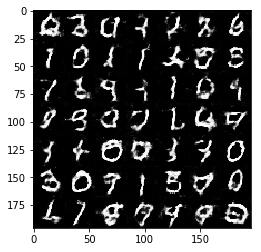

Epoch 2/2... Discriminator Loss: 0.9040... Generator Loss: 1.3753
Epoch 2/2... Discriminator Loss: 1.0313... Generator Loss: 0.7365
Epoch 2/2... Discriminator Loss: 1.3452... Generator Loss: 2.2762
Epoch 2/2... Discriminator Loss: 1.2445... Generator Loss: 1.7607
Epoch 2/2... Discriminator Loss: 0.8505... Generator Loss: 1.3464
Epoch 2/2... Discriminator Loss: 0.9130... Generator Loss: 1.4547
Epoch 2/2... Discriminator Loss: 0.9133... Generator Loss: 2.5523
Epoch 2/2... Discriminator Loss: 1.0365... Generator Loss: 1.5858
Epoch 2/2... Discriminator Loss: 0.9304... Generator Loss: 0.8530
Epoch 2/2... Discriminator Loss: 1.0831... Generator Loss: 0.9646


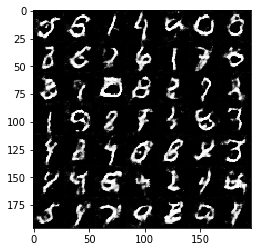

Epoch 2/2... Discriminator Loss: 0.9196... Generator Loss: 1.0203
Epoch 2/2... Discriminator Loss: 1.3102... Generator Loss: 0.5156
Epoch 2/2... Discriminator Loss: 1.3936... Generator Loss: 2.6472
Epoch 2/2... Discriminator Loss: 0.9874... Generator Loss: 0.7836
Epoch 2/2... Discriminator Loss: 0.8735... Generator Loss: 1.2221
Epoch 2/2... Discriminator Loss: 0.8623... Generator Loss: 1.3740
Epoch 2/2... Discriminator Loss: 1.0397... Generator Loss: 0.6446
Epoch 2/2... Discriminator Loss: 1.0827... Generator Loss: 1.8108
Epoch 2/2... Discriminator Loss: 0.9514... Generator Loss: 1.1788
Epoch 2/2... Discriminator Loss: 1.1894... Generator Loss: 0.9150


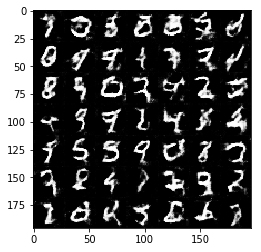

Epoch 2/2... Discriminator Loss: 1.1628... Generator Loss: 1.1753
Epoch 2/2... Discriminator Loss: 1.0290... Generator Loss: 0.7978
Epoch 2/2... Discriminator Loss: 1.0726... Generator Loss: 0.5764
Epoch 2/2... Discriminator Loss: 0.8960... Generator Loss: 0.8803
Epoch 2/2... Discriminator Loss: 0.7966... Generator Loss: 0.8398
Epoch 2/2... Discriminator Loss: 1.0681... Generator Loss: 2.7456
Epoch 2/2... Discriminator Loss: 1.1577... Generator Loss: 0.7248
Epoch 2/2... Discriminator Loss: 0.8415... Generator Loss: 0.9735
Epoch 2/2... Discriminator Loss: 0.8647... Generator Loss: 1.2477
Epoch 2/2... Discriminator Loss: 0.8293... Generator Loss: 0.5672


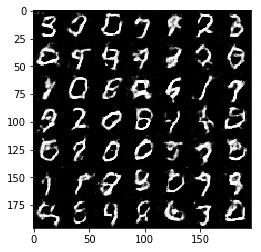

Epoch 2/2... Discriminator Loss: 1.5723... Generator Loss: 2.8379
Epoch 2/2... Discriminator Loss: 1.0431... Generator Loss: 1.2866
Epoch 2/2... Discriminator Loss: 1.0677... Generator Loss: 0.7192
Epoch 2/2... Discriminator Loss: 0.9223... Generator Loss: 2.1255
Epoch 2/2... Discriminator Loss: 0.9906... Generator Loss: 1.5238
Epoch 2/2... Discriminator Loss: 1.1440... Generator Loss: 2.5749
Epoch 2/2... Discriminator Loss: 1.0516... Generator Loss: 1.2438
Epoch 2/2... Discriminator Loss: 0.8252... Generator Loss: 1.8793
Epoch 2/2... Discriminator Loss: 0.9213... Generator Loss: 1.5686
Epoch 2/2... Discriminator Loss: 0.8634... Generator Loss: 1.4484


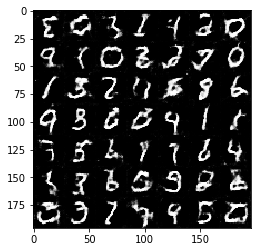

Epoch 2/2... Discriminator Loss: 0.9693... Generator Loss: 0.7243
Epoch 2/2... Discriminator Loss: 0.8785... Generator Loss: 0.7078
Epoch 2/2... Discriminator Loss: 0.8810... Generator Loss: 1.2174
Epoch 2/2... Discriminator Loss: 0.7225... Generator Loss: 2.1708
Epoch 2/2... Discriminator Loss: 1.0641... Generator Loss: 0.7257
Epoch 2/2... Discriminator Loss: 1.1299... Generator Loss: 1.8081
Epoch 2/2... Discriminator Loss: 0.7982... Generator Loss: 1.4155
Epoch 2/2... Discriminator Loss: 1.1158... Generator Loss: 0.6310
Epoch 2/2... Discriminator Loss: 1.1058... Generator Loss: 0.5319
Epoch 2/2... Discriminator Loss: 1.0187... Generator Loss: 0.8754


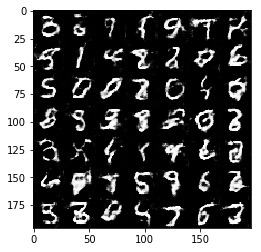

Epoch 2/2... Discriminator Loss: 0.9172... Generator Loss: 1.1677
Epoch 2/2... Discriminator Loss: 0.9292... Generator Loss: 0.8940
Epoch 2/2... Discriminator Loss: 0.9340... Generator Loss: 2.5795
Epoch 2/2... Discriminator Loss: 0.9312... Generator Loss: 1.0077
Epoch 2/2... Discriminator Loss: 1.1269... Generator Loss: 2.7034
Epoch 2/2... Discriminator Loss: 1.2310... Generator Loss: 0.7884
Epoch 2/2... Discriminator Loss: 0.8626... Generator Loss: 1.0539
Epoch 2/2... Discriminator Loss: 0.7878... Generator Loss: 2.0517
Epoch 2/2... Discriminator Loss: 0.6753... Generator Loss: 2.1318
Epoch 2/2... Discriminator Loss: 1.4029... Generator Loss: 3.1744


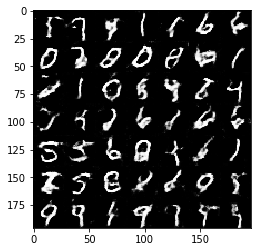

Epoch 2/2... Discriminator Loss: 1.1814... Generator Loss: 0.7325
Epoch 2/2... Discriminator Loss: 0.8956... Generator Loss: 1.6436
Epoch 2/2... Discriminator Loss: 0.9423... Generator Loss: 0.9414
Epoch 2/2... Discriminator Loss: 1.0123... Generator Loss: 1.0680
Epoch 2/2... Discriminator Loss: 0.8515... Generator Loss: 2.0073
Epoch 2/2... Discriminator Loss: 0.8328... Generator Loss: 1.1311
Epoch 2/2... Discriminator Loss: 1.2165... Generator Loss: 0.8315
Epoch 2/2... Discriminator Loss: 0.8891... Generator Loss: 1.2785
Epoch 2/2... Discriminator Loss: 1.2449... Generator Loss: 0.6529
Epoch 2/2... Discriminator Loss: 1.1048... Generator Loss: 1.3238


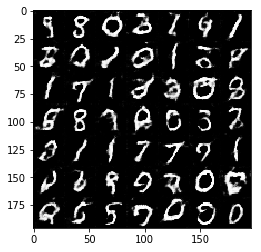

Epoch 2/2... Discriminator Loss: 1.1076... Generator Loss: 2.0401
Epoch 2/2... Discriminator Loss: 1.2625... Generator Loss: 2.0984
Epoch 2/2... Discriminator Loss: 0.8584... Generator Loss: 1.9416
Epoch 2/2... Discriminator Loss: 0.8186... Generator Loss: 1.5046
Epoch 2/2... Discriminator Loss: 1.2166... Generator Loss: 2.1478
Epoch 2/2... Discriminator Loss: 0.9535... Generator Loss: 1.6320
Epoch 2/2... Discriminator Loss: 1.2446... Generator Loss: 0.9159


In [212]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.6966... Generator Loss: 2.2517
Epoch 1/1... Discriminator Loss: 0.6604... Generator Loss: 1.9883
Epoch 1/1... Discriminator Loss: 0.9155... Generator Loss: 3.5280
Epoch 1/1... Discriminator Loss: 0.5715... Generator Loss: 2.3312
Epoch 1/1... Discriminator Loss: 1.1502... Generator Loss: 1.5028
Epoch 1/1... Discriminator Loss: 0.8274... Generator Loss: 2.7025
Epoch 1/1... Discriminator Loss: 0.7475... Generator Loss: 3.5835
Epoch 1/1... Discriminator Loss: 0.7729... Generator Loss: 1.7311
Epoch 1/1... Discriminator Loss: 0.9053... Generator Loss: 2.4024
Epoch 1/1... Discriminator Loss: 0.6365... Generator Loss: 3.7140


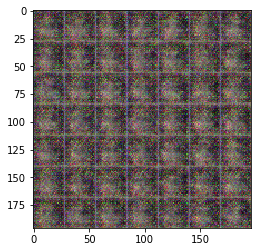

Epoch 1/1... Discriminator Loss: 0.7562... Generator Loss: 1.5781
Epoch 1/1... Discriminator Loss: 0.6004... Generator Loss: 2.4613
Epoch 1/1... Discriminator Loss: 0.5210... Generator Loss: 3.2479
Epoch 1/1... Discriminator Loss: 0.4818... Generator Loss: 3.0986
Epoch 1/1... Discriminator Loss: 0.4629... Generator Loss: 3.6573
Epoch 1/1... Discriminator Loss: 0.4856... Generator Loss: 2.7149
Epoch 1/1... Discriminator Loss: 0.4983... Generator Loss: 4.5846
Epoch 1/1... Discriminator Loss: 0.5006... Generator Loss: 2.2585
Epoch 1/1... Discriminator Loss: 0.5487... Generator Loss: 4.5154
Epoch 1/1... Discriminator Loss: 0.5107... Generator Loss: 4.0262


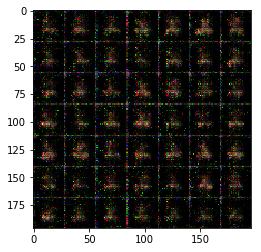

Epoch 1/1... Discriminator Loss: 0.4612... Generator Loss: 3.1484
Epoch 1/1... Discriminator Loss: 0.4639... Generator Loss: 3.5300
Epoch 1/1... Discriminator Loss: 0.5576... Generator Loss: 2.9927
Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.6450
Epoch 1/1... Discriminator Loss: 1.0008... Generator Loss: 3.6132
Epoch 1/1... Discriminator Loss: 0.5402... Generator Loss: 3.1970
Epoch 1/1... Discriminator Loss: 0.6269... Generator Loss: 1.8199
Epoch 1/1... Discriminator Loss: 0.5551... Generator Loss: 1.9791
Epoch 1/1... Discriminator Loss: 0.4153... Generator Loss: 3.8937
Epoch 1/1... Discriminator Loss: 0.5261... Generator Loss: 3.0276


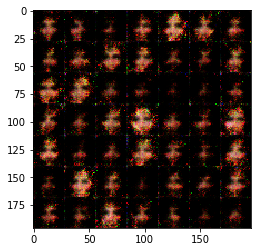

Epoch 1/1... Discriminator Loss: 0.4756... Generator Loss: 2.7430
Epoch 1/1... Discriminator Loss: 0.8560... Generator Loss: 1.3147
Epoch 1/1... Discriminator Loss: 0.4948... Generator Loss: 3.1877
Epoch 1/1... Discriminator Loss: 0.6129... Generator Loss: 1.8980
Epoch 1/1... Discriminator Loss: 0.4620... Generator Loss: 3.7750
Epoch 1/1... Discriminator Loss: 0.4769... Generator Loss: 3.2025
Epoch 1/1... Discriminator Loss: 0.4114... Generator Loss: 3.5283
Epoch 1/1... Discriminator Loss: 0.9150... Generator Loss: 7.3121
Epoch 1/1... Discriminator Loss: 0.4410... Generator Loss: 5.4207
Epoch 1/1... Discriminator Loss: 0.3759... Generator Loss: 4.8968


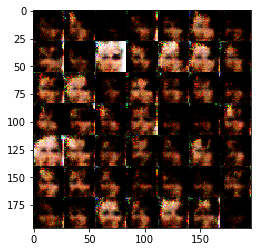

Epoch 1/1... Discriminator Loss: 0.4575... Generator Loss: 3.4534
Epoch 1/1... Discriminator Loss: 0.4176... Generator Loss: 5.6637
Epoch 1/1... Discriminator Loss: 0.4772... Generator Loss: 2.1912
Epoch 1/1... Discriminator Loss: 0.3979... Generator Loss: 2.7021
Epoch 1/1... Discriminator Loss: 0.4299... Generator Loss: 2.5508
Epoch 1/1... Discriminator Loss: 0.4601... Generator Loss: 3.9966
Epoch 1/1... Discriminator Loss: 0.4808... Generator Loss: 2.2687
Epoch 1/1... Discriminator Loss: 1.7378... Generator Loss: 8.9410
Epoch 1/1... Discriminator Loss: 0.9861... Generator Loss: 0.9015
Epoch 1/1... Discriminator Loss: 0.8732... Generator Loss: 2.6407


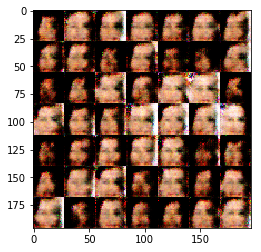

Epoch 1/1... Discriminator Loss: 0.4741... Generator Loss: 4.6666
Epoch 1/1... Discriminator Loss: 0.7277... Generator Loss: 1.5736
Epoch 1/1... Discriminator Loss: 1.2239... Generator Loss: 0.7665
Epoch 1/1... Discriminator Loss: 0.5064... Generator Loss: 2.2384
Epoch 1/1... Discriminator Loss: 0.6344... Generator Loss: 4.3772
Epoch 1/1... Discriminator Loss: 0.6020... Generator Loss: 2.8547
Epoch 1/1... Discriminator Loss: 1.2121... Generator Loss: 1.1849
Epoch 1/1... Discriminator Loss: 0.7607... Generator Loss: 3.3698
Epoch 1/1... Discriminator Loss: 0.7455... Generator Loss: 1.6267
Epoch 1/1... Discriminator Loss: 0.7318... Generator Loss: 1.7866


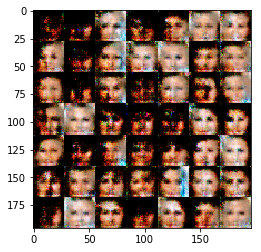

Epoch 1/1... Discriminator Loss: 0.4931... Generator Loss: 2.3668
Epoch 1/1... Discriminator Loss: 0.5667... Generator Loss: 2.1330
Epoch 1/1... Discriminator Loss: 0.7161... Generator Loss: 2.0612
Epoch 1/1... Discriminator Loss: 0.5270... Generator Loss: 3.8430
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 1.0661
Epoch 1/1... Discriminator Loss: 0.5164... Generator Loss: 2.9984
Epoch 1/1... Discriminator Loss: 0.5374... Generator Loss: 2.2992
Epoch 1/1... Discriminator Loss: 0.6608... Generator Loss: 1.8570
Epoch 1/1... Discriminator Loss: 0.7900... Generator Loss: 2.1676
Epoch 1/1... Discriminator Loss: 0.6604... Generator Loss: 1.6211


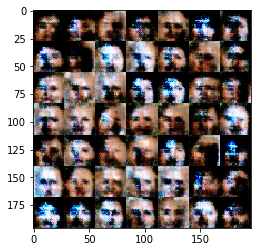

Epoch 1/1... Discriminator Loss: 1.2940... Generator Loss: 1.0585
Epoch 1/1... Discriminator Loss: 0.6661... Generator Loss: 2.3783
Epoch 1/1... Discriminator Loss: 0.7165... Generator Loss: 2.5660
Epoch 1/1... Discriminator Loss: 0.6928... Generator Loss: 1.0419
Epoch 1/1... Discriminator Loss: 1.0148... Generator Loss: 4.8200
Epoch 1/1... Discriminator Loss: 0.6354... Generator Loss: 2.6693
Epoch 1/1... Discriminator Loss: 0.7239... Generator Loss: 1.7545
Epoch 1/1... Discriminator Loss: 0.8014... Generator Loss: 1.8337
Epoch 1/1... Discriminator Loss: 1.2667... Generator Loss: 0.7375
Epoch 1/1... Discriminator Loss: 1.4671... Generator Loss: 0.4501


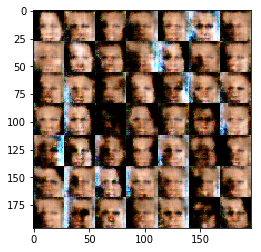

Epoch 1/1... Discriminator Loss: 0.7956... Generator Loss: 1.8063
Epoch 1/1... Discriminator Loss: 2.0548... Generator Loss: 4.8928
Epoch 1/1... Discriminator Loss: 0.5554... Generator Loss: 2.6005
Epoch 1/1... Discriminator Loss: 0.6806... Generator Loss: 1.6290
Epoch 1/1... Discriminator Loss: 0.6565... Generator Loss: 2.5756
Epoch 1/1... Discriminator Loss: 0.7651... Generator Loss: 1.3171
Epoch 1/1... Discriminator Loss: 0.6395... Generator Loss: 2.3686
Epoch 1/1... Discriminator Loss: 1.3344... Generator Loss: 0.8171
Epoch 1/1... Discriminator Loss: 0.8624... Generator Loss: 1.8295
Epoch 1/1... Discriminator Loss: 0.9423... Generator Loss: 3.0692


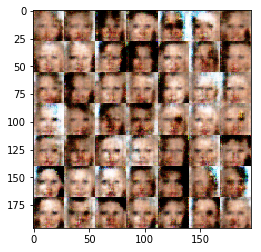

Epoch 1/1... Discriminator Loss: 2.6400... Generator Loss: 0.2626
Epoch 1/1... Discriminator Loss: 0.7771... Generator Loss: 1.7190
Epoch 1/1... Discriminator Loss: 1.0334... Generator Loss: 1.7380
Epoch 1/1... Discriminator Loss: 0.7686... Generator Loss: 2.2665
Epoch 1/1... Discriminator Loss: 1.0885... Generator Loss: 3.5670
Epoch 1/1... Discriminator Loss: 0.8315... Generator Loss: 1.7940
Epoch 1/1... Discriminator Loss: 0.6659... Generator Loss: 1.7378
Epoch 1/1... Discriminator Loss: 0.8887... Generator Loss: 1.8976
Epoch 1/1... Discriminator Loss: 0.8105... Generator Loss: 2.4999
Epoch 1/1... Discriminator Loss: 0.7019... Generator Loss: 1.5215


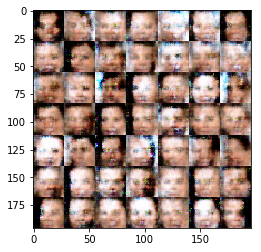

Epoch 1/1... Discriminator Loss: 0.6722... Generator Loss: 2.4884
Epoch 1/1... Discriminator Loss: 0.8817... Generator Loss: 1.2360
Epoch 1/1... Discriminator Loss: 0.6793... Generator Loss: 3.3390
Epoch 1/1... Discriminator Loss: 1.9854... Generator Loss: 0.3829
Epoch 1/1... Discriminator Loss: 1.2396... Generator Loss: 2.2378
Epoch 1/1... Discriminator Loss: 1.0355... Generator Loss: 1.0657
Epoch 1/1... Discriminator Loss: 0.5002... Generator Loss: 2.1444
Epoch 1/1... Discriminator Loss: 1.7235... Generator Loss: 0.5033
Epoch 1/1... Discriminator Loss: 1.4532... Generator Loss: 0.9628
Epoch 1/1... Discriminator Loss: 0.5166... Generator Loss: 2.5965


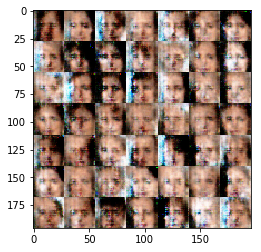

Epoch 1/1... Discriminator Loss: 1.5225... Generator Loss: 0.6327
Epoch 1/1... Discriminator Loss: 1.1620... Generator Loss: 1.2576
Epoch 1/1... Discriminator Loss: 0.6907... Generator Loss: 2.1220
Epoch 1/1... Discriminator Loss: 0.5419... Generator Loss: 2.7582
Epoch 1/1... Discriminator Loss: 0.4774... Generator Loss: 3.2180
Epoch 1/1... Discriminator Loss: 0.9186... Generator Loss: 1.3058
Epoch 1/1... Discriminator Loss: 0.5844... Generator Loss: 1.5500
Epoch 1/1... Discriminator Loss: 0.6651... Generator Loss: 1.7559
Epoch 1/1... Discriminator Loss: 0.7018... Generator Loss: 2.7914
Epoch 1/1... Discriminator Loss: 0.6118... Generator Loss: 2.9774


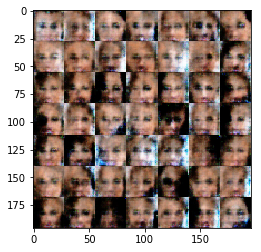

Epoch 1/1... Discriminator Loss: 1.4774... Generator Loss: 0.3654
Epoch 1/1... Discriminator Loss: 0.6827... Generator Loss: 1.6220
Epoch 1/1... Discriminator Loss: 1.1245... Generator Loss: 1.2479
Epoch 1/1... Discriminator Loss: 0.7171... Generator Loss: 2.2481
Epoch 1/1... Discriminator Loss: 0.6362... Generator Loss: 2.5586
Epoch 1/1... Discriminator Loss: 0.5789... Generator Loss: 3.1351
Epoch 1/1... Discriminator Loss: 0.6951... Generator Loss: 2.2896
Epoch 1/1... Discriminator Loss: 0.5064... Generator Loss: 1.9334
Epoch 1/1... Discriminator Loss: 0.7560... Generator Loss: 2.0438
Epoch 1/1... Discriminator Loss: 0.8481... Generator Loss: 1.3605


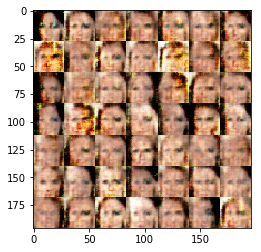

Epoch 1/1... Discriminator Loss: 0.4507... Generator Loss: 3.1380
Epoch 1/1... Discriminator Loss: 0.5372... Generator Loss: 2.5709
Epoch 1/1... Discriminator Loss: 0.5638... Generator Loss: 1.3852
Epoch 1/1... Discriminator Loss: 0.7921... Generator Loss: 0.9595
Epoch 1/1... Discriminator Loss: 0.6762... Generator Loss: 1.4245
Epoch 1/1... Discriminator Loss: 0.7666... Generator Loss: 1.3322
Epoch 1/1... Discriminator Loss: 1.6657... Generator Loss: 0.4841
Epoch 1/1... Discriminator Loss: 0.8039... Generator Loss: 1.9913
Epoch 1/1... Discriminator Loss: 0.8441... Generator Loss: 1.4552
Epoch 1/1... Discriminator Loss: 0.7251... Generator Loss: 3.7026


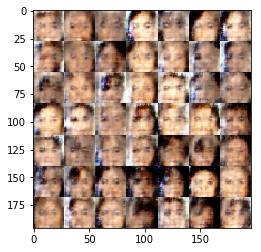

Epoch 1/1... Discriminator Loss: 0.6927... Generator Loss: 3.3082
Epoch 1/1... Discriminator Loss: 0.5995... Generator Loss: 3.1229
Epoch 1/1... Discriminator Loss: 1.4351... Generator Loss: 0.7051
Epoch 1/1... Discriminator Loss: 1.3710... Generator Loss: 1.0961
Epoch 1/1... Discriminator Loss: 1.0246... Generator Loss: 0.8901
Epoch 1/1... Discriminator Loss: 1.0326... Generator Loss: 1.0935
Epoch 1/1... Discriminator Loss: 0.9724... Generator Loss: 3.4444
Epoch 1/1... Discriminator Loss: 1.0390... Generator Loss: 1.2982
Epoch 1/1... Discriminator Loss: 0.6589... Generator Loss: 1.3939
Epoch 1/1... Discriminator Loss: 1.3014... Generator Loss: 0.5391


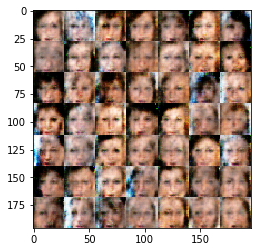

Epoch 1/1... Discriminator Loss: 0.6923... Generator Loss: 1.5606
Epoch 1/1... Discriminator Loss: 0.7796... Generator Loss: 1.5151
Epoch 1/1... Discriminator Loss: 0.7900... Generator Loss: 1.3033
Epoch 1/1... Discriminator Loss: 1.1785... Generator Loss: 0.4962
Epoch 1/1... Discriminator Loss: 0.7102... Generator Loss: 1.9901
Epoch 1/1... Discriminator Loss: 1.1130... Generator Loss: 1.6049
Epoch 1/1... Discriminator Loss: 1.0643... Generator Loss: 3.4692
Epoch 1/1... Discriminator Loss: 0.6791... Generator Loss: 1.1573
Epoch 1/1... Discriminator Loss: 0.5549... Generator Loss: 2.2112
Epoch 1/1... Discriminator Loss: 0.8912... Generator Loss: 3.3116


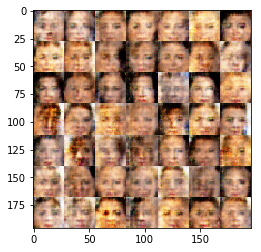

Epoch 1/1... Discriminator Loss: 0.8273... Generator Loss: 2.4415
Epoch 1/1... Discriminator Loss: 1.9180... Generator Loss: 0.2551
Epoch 1/1... Discriminator Loss: 0.5827... Generator Loss: 1.1695
Epoch 1/1... Discriminator Loss: 0.7398... Generator Loss: 1.2933
Epoch 1/1... Discriminator Loss: 0.6645... Generator Loss: 0.9486
Epoch 1/1... Discriminator Loss: 0.9055... Generator Loss: 2.3915
Epoch 1/1... Discriminator Loss: 0.9196... Generator Loss: 2.1552
Epoch 1/1... Discriminator Loss: 0.9961... Generator Loss: 1.1441
Epoch 1/1... Discriminator Loss: 1.0998... Generator Loss: 2.2885
Epoch 1/1... Discriminator Loss: 0.9577... Generator Loss: 0.9463


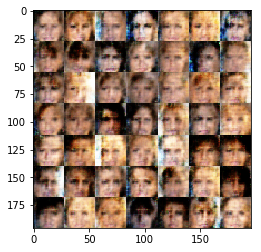

Epoch 1/1... Discriminator Loss: 0.8056... Generator Loss: 1.6025
Epoch 1/1... Discriminator Loss: 0.9724... Generator Loss: 0.7958
Epoch 1/1... Discriminator Loss: 0.5391... Generator Loss: 3.2794
Epoch 1/1... Discriminator Loss: 0.6783... Generator Loss: 1.0347
Epoch 1/1... Discriminator Loss: 0.7216... Generator Loss: 2.0139
Epoch 1/1... Discriminator Loss: 0.9794... Generator Loss: 1.3303
Epoch 1/1... Discriminator Loss: 0.7843... Generator Loss: 2.7521
Epoch 1/1... Discriminator Loss: 1.2000... Generator Loss: 0.7113
Epoch 1/1... Discriminator Loss: 0.7931... Generator Loss: 2.9683
Epoch 1/1... Discriminator Loss: 1.0472... Generator Loss: 0.6066


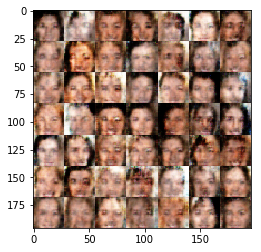

Epoch 1/1... Discriminator Loss: 0.6702... Generator Loss: 1.5015
Epoch 1/1... Discriminator Loss: 1.0872... Generator Loss: 1.6459
Epoch 1/1... Discriminator Loss: 0.8121... Generator Loss: 1.3987
Epoch 1/1... Discriminator Loss: 0.9043... Generator Loss: 1.4525
Epoch 1/1... Discriminator Loss: 1.1169... Generator Loss: 2.6638
Epoch 1/1... Discriminator Loss: 0.9490... Generator Loss: 1.2197
Epoch 1/1... Discriminator Loss: 0.4715... Generator Loss: 2.9368
Epoch 1/1... Discriminator Loss: 0.8285... Generator Loss: 2.1195
Epoch 1/1... Discriminator Loss: 0.7983... Generator Loss: 0.9369
Epoch 1/1... Discriminator Loss: 1.0837... Generator Loss: 0.6809


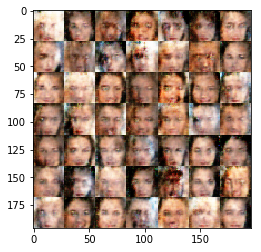

Epoch 1/1... Discriminator Loss: 0.7517... Generator Loss: 1.9846
Epoch 1/1... Discriminator Loss: 0.8686... Generator Loss: 1.9752
Epoch 1/1... Discriminator Loss: 1.6344... Generator Loss: 3.5138
Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 0.6866
Epoch 1/1... Discriminator Loss: 0.7158... Generator Loss: 2.1466
Epoch 1/1... Discriminator Loss: 1.0114... Generator Loss: 2.4657
Epoch 1/1... Discriminator Loss: 0.8795... Generator Loss: 1.2659
Epoch 1/1... Discriminator Loss: 0.7043... Generator Loss: 2.7954
Epoch 1/1... Discriminator Loss: 0.7016... Generator Loss: 2.1030
Epoch 1/1... Discriminator Loss: 0.9502... Generator Loss: 2.2414


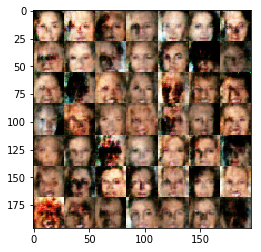

Epoch 1/1... Discriminator Loss: 1.5113... Generator Loss: 0.4780
Epoch 1/1... Discriminator Loss: 0.7245... Generator Loss: 1.7071
Epoch 1/1... Discriminator Loss: 1.1980... Generator Loss: 1.0912
Epoch 1/1... Discriminator Loss: 0.7484... Generator Loss: 1.7495
Epoch 1/1... Discriminator Loss: 0.9596... Generator Loss: 1.9832
Epoch 1/1... Discriminator Loss: 0.7833... Generator Loss: 1.0404
Epoch 1/1... Discriminator Loss: 0.7075... Generator Loss: 1.2976
Epoch 1/1... Discriminator Loss: 0.7529... Generator Loss: 1.1642
Epoch 1/1... Discriminator Loss: 0.5075... Generator Loss: 1.7346
Epoch 1/1... Discriminator Loss: 0.9134... Generator Loss: 1.7559


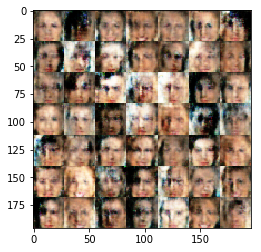

Epoch 1/1... Discriminator Loss: 0.8228... Generator Loss: 1.5840
Epoch 1/1... Discriminator Loss: 0.6668... Generator Loss: 2.3013
Epoch 1/1... Discriminator Loss: 0.9541... Generator Loss: 1.2608
Epoch 1/1... Discriminator Loss: 0.8774... Generator Loss: 1.5588
Epoch 1/1... Discriminator Loss: 0.9910... Generator Loss: 1.0185
Epoch 1/1... Discriminator Loss: 1.1185... Generator Loss: 0.8196
Epoch 1/1... Discriminator Loss: 1.0240... Generator Loss: 1.8569
Epoch 1/1... Discriminator Loss: 0.6880... Generator Loss: 2.6467
Epoch 1/1... Discriminator Loss: 0.7295... Generator Loss: 1.0981
Epoch 1/1... Discriminator Loss: 1.3386... Generator Loss: 3.0843


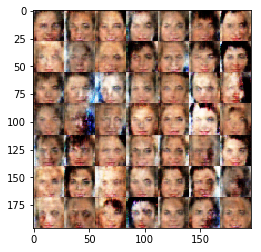

Epoch 1/1... Discriminator Loss: 0.9519... Generator Loss: 1.4091
Epoch 1/1... Discriminator Loss: 0.8685... Generator Loss: 2.6763
Epoch 1/1... Discriminator Loss: 0.9747... Generator Loss: 1.5239
Epoch 1/1... Discriminator Loss: 1.0032... Generator Loss: 1.2879
Epoch 1/1... Discriminator Loss: 0.9848... Generator Loss: 1.4541
Epoch 1/1... Discriminator Loss: 1.1496... Generator Loss: 1.2132
Epoch 1/1... Discriminator Loss: 1.2099... Generator Loss: 2.3384
Epoch 1/1... Discriminator Loss: 0.8286... Generator Loss: 2.3518
Epoch 1/1... Discriminator Loss: 1.0167... Generator Loss: 0.6479
Epoch 1/1... Discriminator Loss: 0.5748... Generator Loss: 1.6901


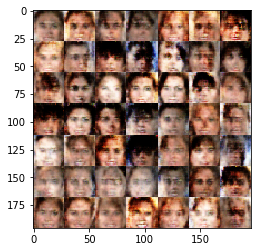

Epoch 1/1... Discriminator Loss: 1.1115... Generator Loss: 2.7424
Epoch 1/1... Discriminator Loss: 0.8287... Generator Loss: 2.5540
Epoch 1/1... Discriminator Loss: 0.9390... Generator Loss: 3.0413
Epoch 1/1... Discriminator Loss: 0.9419... Generator Loss: 1.2679
Epoch 1/1... Discriminator Loss: 1.3097... Generator Loss: 0.5185
Epoch 1/1... Discriminator Loss: 1.0312... Generator Loss: 0.9332
Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 1.2510
Epoch 1/1... Discriminator Loss: 0.7032... Generator Loss: 2.3031
Epoch 1/1... Discriminator Loss: 0.8803... Generator Loss: 1.2274
Epoch 1/1... Discriminator Loss: 0.9628... Generator Loss: 1.4812


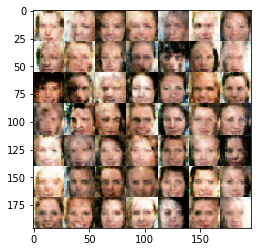

Epoch 1/1... Discriminator Loss: 0.6983... Generator Loss: 1.2446
Epoch 1/1... Discriminator Loss: 0.7049... Generator Loss: 2.1891
Epoch 1/1... Discriminator Loss: 0.9722... Generator Loss: 1.6647
Epoch 1/1... Discriminator Loss: 0.9157... Generator Loss: 1.1763
Epoch 1/1... Discriminator Loss: 0.7380... Generator Loss: 0.9621
Epoch 1/1... Discriminator Loss: 0.6345... Generator Loss: 2.3954
Epoch 1/1... Discriminator Loss: 1.1167... Generator Loss: 2.0754
Epoch 1/1... Discriminator Loss: 1.0262... Generator Loss: 1.7566
Epoch 1/1... Discriminator Loss: 1.2294... Generator Loss: 1.2382
Epoch 1/1... Discriminator Loss: 0.9118... Generator Loss: 0.9698


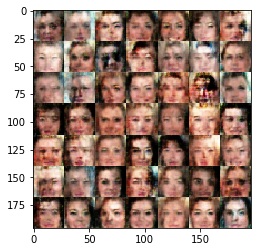

Epoch 1/1... Discriminator Loss: 1.0742... Generator Loss: 1.5193
Epoch 1/1... Discriminator Loss: 0.6429... Generator Loss: 2.4125
Epoch 1/1... Discriminator Loss: 0.9264... Generator Loss: 2.4017
Epoch 1/1... Discriminator Loss: 1.0721... Generator Loss: 0.6379
Epoch 1/1... Discriminator Loss: 0.9392... Generator Loss: 1.5740
Epoch 1/1... Discriminator Loss: 0.9221... Generator Loss: 1.1668
Epoch 1/1... Discriminator Loss: 0.7641... Generator Loss: 2.1670
Epoch 1/1... Discriminator Loss: 1.1177... Generator Loss: 0.8852
Epoch 1/1... Discriminator Loss: 0.6119... Generator Loss: 1.3014
Epoch 1/1... Discriminator Loss: 1.5163... Generator Loss: 1.0007


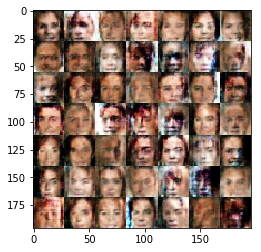

Epoch 1/1... Discriminator Loss: 1.2270... Generator Loss: 1.2322
Epoch 1/1... Discriminator Loss: 1.0658... Generator Loss: 1.1474
Epoch 1/1... Discriminator Loss: 0.8678... Generator Loss: 4.0005
Epoch 1/1... Discriminator Loss: 1.4056... Generator Loss: 2.4181
Epoch 1/1... Discriminator Loss: 0.6325... Generator Loss: 1.6987
Epoch 1/1... Discriminator Loss: 0.5802... Generator Loss: 1.7752
Epoch 1/1... Discriminator Loss: 1.1267... Generator Loss: 2.6429
Epoch 1/1... Discriminator Loss: 0.8737... Generator Loss: 2.3081
Epoch 1/1... Discriminator Loss: 1.2447... Generator Loss: 0.6598
Epoch 1/1... Discriminator Loss: 1.2730... Generator Loss: 1.0254


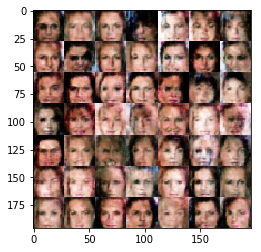

Epoch 1/1... Discriminator Loss: 1.0662... Generator Loss: 0.6623
Epoch 1/1... Discriminator Loss: 0.9551... Generator Loss: 0.9157
Epoch 1/1... Discriminator Loss: 0.6392... Generator Loss: 2.1014
Epoch 1/1... Discriminator Loss: 0.7555... Generator Loss: 1.4918
Epoch 1/1... Discriminator Loss: 1.2207... Generator Loss: 1.3871
Epoch 1/1... Discriminator Loss: 1.0290... Generator Loss: 3.2011
Epoch 1/1... Discriminator Loss: 0.8028... Generator Loss: 1.5616
Epoch 1/1... Discriminator Loss: 0.7292... Generator Loss: 1.6591
Epoch 1/1... Discriminator Loss: 0.8210... Generator Loss: 1.4323
Epoch 1/1... Discriminator Loss: 1.3656... Generator Loss: 0.7768


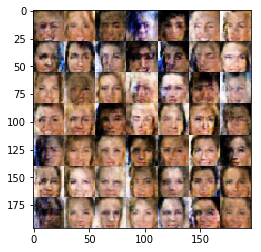

Epoch 1/1... Discriminator Loss: 1.2532... Generator Loss: 1.3555
Epoch 1/1... Discriminator Loss: 1.0135... Generator Loss: 1.3356
Epoch 1/1... Discriminator Loss: 0.9800... Generator Loss: 1.7944
Epoch 1/1... Discriminator Loss: 0.7759... Generator Loss: 1.8695
Epoch 1/1... Discriminator Loss: 0.6651... Generator Loss: 1.3044
Epoch 1/1... Discriminator Loss: 1.5940... Generator Loss: 0.4065
Epoch 1/1... Discriminator Loss: 1.3010... Generator Loss: 0.4427
Epoch 1/1... Discriminator Loss: 0.8658... Generator Loss: 1.6881
Epoch 1/1... Discriminator Loss: 0.8374... Generator Loss: 1.0789
Epoch 1/1... Discriminator Loss: 0.9415... Generator Loss: 1.7954


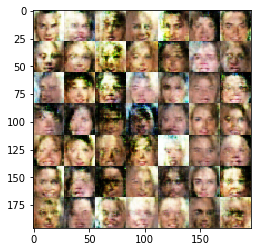

Epoch 1/1... Discriminator Loss: 1.0245... Generator Loss: 2.4708
Epoch 1/1... Discriminator Loss: 1.0834... Generator Loss: 2.9937
Epoch 1/1... Discriminator Loss: 1.4773... Generator Loss: 0.6256
Epoch 1/1... Discriminator Loss: 0.9458... Generator Loss: 0.9436
Epoch 1/1... Discriminator Loss: 1.2243... Generator Loss: 2.0856
Epoch 1/1... Discriminator Loss: 1.1410... Generator Loss: 1.4454
Epoch 1/1... Discriminator Loss: 0.8175... Generator Loss: 0.7644
Epoch 1/1... Discriminator Loss: 0.9467... Generator Loss: 2.1011
Epoch 1/1... Discriminator Loss: 1.2389... Generator Loss: 0.7536
Epoch 1/1... Discriminator Loss: 0.8615... Generator Loss: 0.9272


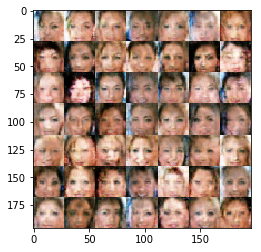

Epoch 1/1... Discriminator Loss: 0.6736... Generator Loss: 1.4401
Epoch 1/1... Discriminator Loss: 1.0607... Generator Loss: 0.8393
Epoch 1/1... Discriminator Loss: 0.7813... Generator Loss: 1.0563
Epoch 1/1... Discriminator Loss: 0.9210... Generator Loss: 3.0991
Epoch 1/1... Discriminator Loss: 0.7500... Generator Loss: 0.8757
Epoch 1/1... Discriminator Loss: 0.9510... Generator Loss: 1.0560
Epoch 1/1... Discriminator Loss: 0.9536... Generator Loss: 1.4044
Epoch 1/1... Discriminator Loss: 0.8921... Generator Loss: 1.6544
Epoch 1/1... Discriminator Loss: 0.9439... Generator Loss: 2.5919
Epoch 1/1... Discriminator Loss: 1.4886... Generator Loss: 0.4982


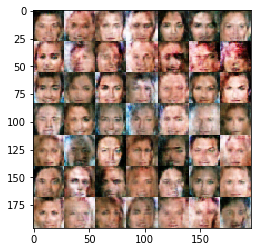

Epoch 1/1... Discriminator Loss: 0.7416... Generator Loss: 0.8587
Epoch 1/1... Discriminator Loss: 0.7674... Generator Loss: 0.9244
Epoch 1/1... Discriminator Loss: 0.9876... Generator Loss: 1.0196
Epoch 1/1... Discriminator Loss: 0.9221... Generator Loss: 1.0212
Epoch 1/1... Discriminator Loss: 0.8370... Generator Loss: 1.2157
Epoch 1/1... Discriminator Loss: 0.7534... Generator Loss: 2.3574
Epoch 1/1... Discriminator Loss: 0.8311... Generator Loss: 1.0088
Epoch 1/1... Discriminator Loss: 0.7842... Generator Loss: 0.6078
Epoch 1/1... Discriminator Loss: 0.8062... Generator Loss: 1.9046
Epoch 1/1... Discriminator Loss: 0.8922... Generator Loss: 0.6956


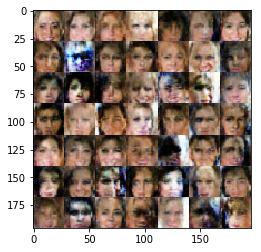

Epoch 1/1... Discriminator Loss: 0.7413... Generator Loss: 1.0263
Epoch 1/1... Discriminator Loss: 0.8247... Generator Loss: 1.6237
Epoch 1/1... Discriminator Loss: 1.1375... Generator Loss: 1.9709
Epoch 1/1... Discriminator Loss: 0.8298... Generator Loss: 0.9058
Epoch 1/1... Discriminator Loss: 0.5771... Generator Loss: 1.2825
Epoch 1/1... Discriminator Loss: 0.8123... Generator Loss: 2.8903
Epoch 1/1... Discriminator Loss: 0.6208... Generator Loss: 1.2255
Epoch 1/1... Discriminator Loss: 1.4544... Generator Loss: 0.7634
Epoch 1/1... Discriminator Loss: 1.1721... Generator Loss: 0.8987
Epoch 1/1... Discriminator Loss: 1.3136... Generator Loss: 0.9086


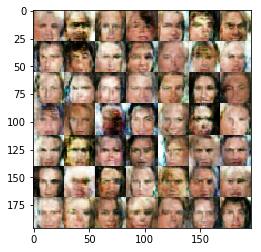

Epoch 1/1... Discriminator Loss: 0.7194... Generator Loss: 1.3964
Epoch 1/1... Discriminator Loss: 0.6738... Generator Loss: 1.9520
Epoch 1/1... Discriminator Loss: 0.7965... Generator Loss: 2.0207
Epoch 1/1... Discriminator Loss: 0.8379... Generator Loss: 1.6032
Epoch 1/1... Discriminator Loss: 0.8950... Generator Loss: 1.7048
Epoch 1/1... Discriminator Loss: 1.0345... Generator Loss: 1.3920
Epoch 1/1... Discriminator Loss: 1.4184... Generator Loss: 2.5614
Epoch 1/1... Discriminator Loss: 1.3914... Generator Loss: 1.7282
Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 0.5980
Epoch 1/1... Discriminator Loss: 0.7750... Generator Loss: 0.9772


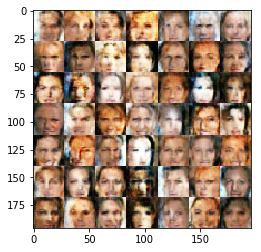

Epoch 1/1... Discriminator Loss: 1.0072... Generator Loss: 2.0502
Epoch 1/1... Discriminator Loss: 0.8950... Generator Loss: 1.4838
Epoch 1/1... Discriminator Loss: 1.0169... Generator Loss: 1.3570
Epoch 1/1... Discriminator Loss: 0.8086... Generator Loss: 0.9826
Epoch 1/1... Discriminator Loss: 0.8778... Generator Loss: 1.3324
Epoch 1/1... Discriminator Loss: 0.8367... Generator Loss: 1.0817
Epoch 1/1... Discriminator Loss: 1.2999... Generator Loss: 2.2878
Epoch 1/1... Discriminator Loss: 0.8637... Generator Loss: 2.8742
Epoch 1/1... Discriminator Loss: 1.0881... Generator Loss: 0.7858
Epoch 1/1... Discriminator Loss: 0.9479... Generator Loss: 3.1696


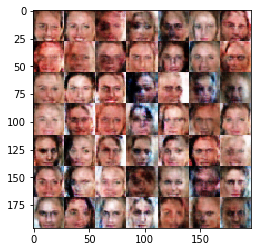

Epoch 1/1... Discriminator Loss: 1.0563... Generator Loss: 0.9832
Epoch 1/1... Discriminator Loss: 0.9518... Generator Loss: 1.1915
Epoch 1/1... Discriminator Loss: 0.7000... Generator Loss: 1.9266
Epoch 1/1... Discriminator Loss: 0.6138... Generator Loss: 1.6652
Epoch 1/1... Discriminator Loss: 1.4259... Generator Loss: 2.4609
Epoch 1/1... Discriminator Loss: 0.8260... Generator Loss: 1.1784
Epoch 1/1... Discriminator Loss: 0.8760... Generator Loss: 1.2449
Epoch 1/1... Discriminator Loss: 1.1612... Generator Loss: 1.7644
Epoch 1/1... Discriminator Loss: 0.5430... Generator Loss: 2.1738
Epoch 1/1... Discriminator Loss: 0.8164... Generator Loss: 1.5959


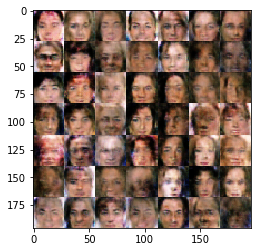

Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 1.1383
Epoch 1/1... Discriminator Loss: 0.9861... Generator Loss: 0.7549
Epoch 1/1... Discriminator Loss: 0.7857... Generator Loss: 2.0140
Epoch 1/1... Discriminator Loss: 1.3035... Generator Loss: 1.0562
Epoch 1/1... Discriminator Loss: 0.7029... Generator Loss: 2.4037
Epoch 1/1... Discriminator Loss: 0.8334... Generator Loss: 2.0850
Epoch 1/1... Discriminator Loss: 1.0591... Generator Loss: 2.5140
Epoch 1/1... Discriminator Loss: 1.0055... Generator Loss: 1.0176
Epoch 1/1... Discriminator Loss: 0.9835... Generator Loss: 1.7113
Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 0.9081


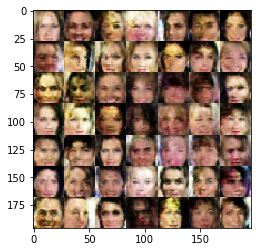

Epoch 1/1... Discriminator Loss: 1.3183... Generator Loss: 0.8318
Epoch 1/1... Discriminator Loss: 0.5376... Generator Loss: 2.0462
Epoch 1/1... Discriminator Loss: 0.7253... Generator Loss: 2.0876
Epoch 1/1... Discriminator Loss: 0.8407... Generator Loss: 1.0851
Epoch 1/1... Discriminator Loss: 1.2009... Generator Loss: 1.4429
Epoch 1/1... Discriminator Loss: 0.9318... Generator Loss: 1.2082
Epoch 1/1... Discriminator Loss: 0.9270... Generator Loss: 0.6096
Epoch 1/1... Discriminator Loss: 0.9361... Generator Loss: 2.2023
Epoch 1/1... Discriminator Loss: 0.9305... Generator Loss: 1.0219
Epoch 1/1... Discriminator Loss: 0.7605... Generator Loss: 1.9196


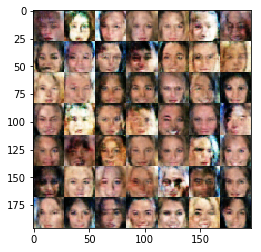

Epoch 1/1... Discriminator Loss: 0.8217... Generator Loss: 1.5363
Epoch 1/1... Discriminator Loss: 1.2613... Generator Loss: 2.7304
Epoch 1/1... Discriminator Loss: 1.4591... Generator Loss: 2.0740
Epoch 1/1... Discriminator Loss: 0.9514... Generator Loss: 1.1209
Epoch 1/1... Discriminator Loss: 1.3511... Generator Loss: 2.7069
Epoch 1/1... Discriminator Loss: 1.1058... Generator Loss: 0.7762
Epoch 1/1... Discriminator Loss: 1.1101... Generator Loss: 1.4865
Epoch 1/1... Discriminator Loss: 1.0983... Generator Loss: 1.0254
Epoch 1/1... Discriminator Loss: 0.8976... Generator Loss: 1.4333
Epoch 1/1... Discriminator Loss: 1.0200... Generator Loss: 0.7254


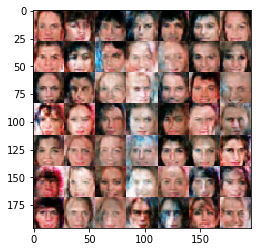

Epoch 1/1... Discriminator Loss: 0.9285... Generator Loss: 0.7701
Epoch 1/1... Discriminator Loss: 1.2308... Generator Loss: 2.4692
Epoch 1/1... Discriminator Loss: 0.6304... Generator Loss: 2.5045
Epoch 1/1... Discriminator Loss: 0.7052... Generator Loss: 1.3813
Epoch 1/1... Discriminator Loss: 0.6889... Generator Loss: 1.4049
Epoch 1/1... Discriminator Loss: 0.9124... Generator Loss: 2.2127
Epoch 1/1... Discriminator Loss: 1.1452... Generator Loss: 2.0521
Epoch 1/1... Discriminator Loss: 0.9809... Generator Loss: 1.2196
Epoch 1/1... Discriminator Loss: 1.1405... Generator Loss: 0.6948
Epoch 1/1... Discriminator Loss: 0.9830... Generator Loss: 0.9995


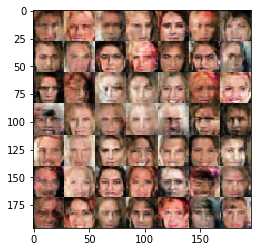

Epoch 1/1... Discriminator Loss: 0.6594... Generator Loss: 1.1947
Epoch 1/1... Discriminator Loss: 0.7071... Generator Loss: 0.9553
Epoch 1/1... Discriminator Loss: 0.7074... Generator Loss: 1.9086
Epoch 1/1... Discriminator Loss: 1.2275... Generator Loss: 1.0869
Epoch 1/1... Discriminator Loss: 0.8725... Generator Loss: 1.8584
Epoch 1/1... Discriminator Loss: 0.7870... Generator Loss: 2.0262
Epoch 1/1... Discriminator Loss: 0.9644... Generator Loss: 1.4525
Epoch 1/1... Discriminator Loss: 1.2320... Generator Loss: 0.9338
Epoch 1/1... Discriminator Loss: 1.2379... Generator Loss: 0.7777
Epoch 1/1... Discriminator Loss: 0.8054... Generator Loss: 0.8126


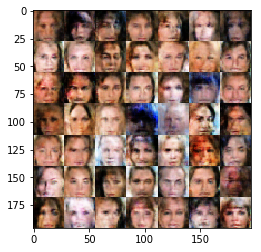

Epoch 1/1... Discriminator Loss: 0.9296... Generator Loss: 0.9978
Epoch 1/1... Discriminator Loss: 1.1592... Generator Loss: 1.0171
Epoch 1/1... Discriminator Loss: 0.8130... Generator Loss: 1.2355
Epoch 1/1... Discriminator Loss: 1.2438... Generator Loss: 2.8328
Epoch 1/1... Discriminator Loss: 1.1034... Generator Loss: 0.8243
Epoch 1/1... Discriminator Loss: 1.0069... Generator Loss: 1.0081
Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.2672
Epoch 1/1... Discriminator Loss: 0.6842... Generator Loss: 1.3990
Epoch 1/1... Discriminator Loss: 1.8949... Generator Loss: 0.4889
Epoch 1/1... Discriminator Loss: 0.8490... Generator Loss: 1.1620


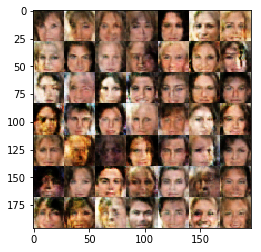

Epoch 1/1... Discriminator Loss: 0.8902... Generator Loss: 1.4172
Epoch 1/1... Discriminator Loss: 0.6332... Generator Loss: 1.4958
Epoch 1/1... Discriminator Loss: 1.4642... Generator Loss: 3.8149
Epoch 1/1... Discriminator Loss: 0.7223... Generator Loss: 1.9002
Epoch 1/1... Discriminator Loss: 1.0650... Generator Loss: 1.9762
Epoch 1/1... Discriminator Loss: 1.0395... Generator Loss: 1.1920
Epoch 1/1... Discriminator Loss: 0.6882... Generator Loss: 1.3776
Epoch 1/1... Discriminator Loss: 1.0600... Generator Loss: 0.8960
Epoch 1/1... Discriminator Loss: 1.1313... Generator Loss: 1.0110
Epoch 1/1... Discriminator Loss: 0.6977... Generator Loss: 1.6669


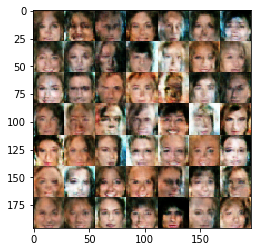

Epoch 1/1... Discriminator Loss: 0.5846... Generator Loss: 3.0700
Epoch 1/1... Discriminator Loss: 0.8156... Generator Loss: 1.7894
Epoch 1/1... Discriminator Loss: 0.7713... Generator Loss: 1.6884
Epoch 1/1... Discriminator Loss: 0.6719... Generator Loss: 1.5555
Epoch 1/1... Discriminator Loss: 0.8310... Generator Loss: 1.4408
Epoch 1/1... Discriminator Loss: 1.3016... Generator Loss: 1.9785
Epoch 1/1... Discriminator Loss: 0.6553... Generator Loss: 1.7572
Epoch 1/1... Discriminator Loss: 1.1624... Generator Loss: 1.8910
Epoch 1/1... Discriminator Loss: 1.6470... Generator Loss: 0.4869
Epoch 1/1... Discriminator Loss: 1.1046... Generator Loss: 2.7249


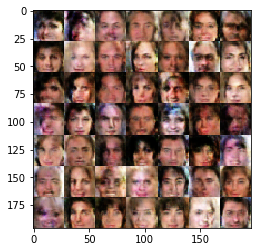

Epoch 1/1... Discriminator Loss: 0.7566... Generator Loss: 1.4032
Epoch 1/1... Discriminator Loss: 1.0408... Generator Loss: 2.6960
Epoch 1/1... Discriminator Loss: 0.9337... Generator Loss: 1.7134
Epoch 1/1... Discriminator Loss: 0.6515... Generator Loss: 1.7310
Epoch 1/1... Discriminator Loss: 1.1596... Generator Loss: 0.3829
Epoch 1/1... Discriminator Loss: 1.3520... Generator Loss: 0.6975
Epoch 1/1... Discriminator Loss: 0.5745... Generator Loss: 2.1546
Epoch 1/1... Discriminator Loss: 0.6792... Generator Loss: 1.3973
Epoch 1/1... Discriminator Loss: 0.8684... Generator Loss: 1.9849
Epoch 1/1... Discriminator Loss: 1.2245... Generator Loss: 0.6804


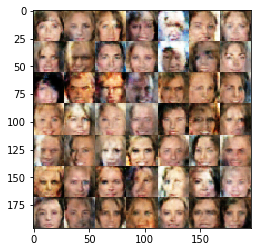

Epoch 1/1... Discriminator Loss: 1.2859... Generator Loss: 3.1828
Epoch 1/1... Discriminator Loss: 0.8502... Generator Loss: 1.0057
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6915
Epoch 1/1... Discriminator Loss: 0.7951... Generator Loss: 1.0059
Epoch 1/1... Discriminator Loss: 0.5886... Generator Loss: 1.8222
Epoch 1/1... Discriminator Loss: 0.6031... Generator Loss: 2.8744
Epoch 1/1... Discriminator Loss: 1.0406... Generator Loss: 0.7167
Epoch 1/1... Discriminator Loss: 0.6107... Generator Loss: 1.4844
Epoch 1/1... Discriminator Loss: 0.9502... Generator Loss: 1.5772
Epoch 1/1... Discriminator Loss: 1.0944... Generator Loss: 1.3956


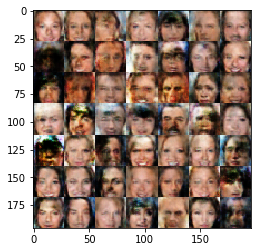

Epoch 1/1... Discriminator Loss: 0.8260... Generator Loss: 1.1157
Epoch 1/1... Discriminator Loss: 0.7194... Generator Loss: 2.0873
Epoch 1/1... Discriminator Loss: 0.7195... Generator Loss: 1.7280
Epoch 1/1... Discriminator Loss: 1.0033... Generator Loss: 1.3810
Epoch 1/1... Discriminator Loss: 1.0315... Generator Loss: 1.6691
Epoch 1/1... Discriminator Loss: 0.7366... Generator Loss: 1.2402
Epoch 1/1... Discriminator Loss: 0.7013... Generator Loss: 1.8464
Epoch 1/1... Discriminator Loss: 0.7636... Generator Loss: 0.7101
Epoch 1/1... Discriminator Loss: 1.0790... Generator Loss: 1.1083
Epoch 1/1... Discriminator Loss: 0.8319... Generator Loss: 1.0981


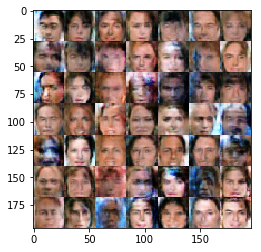

Epoch 1/1... Discriminator Loss: 0.5015... Generator Loss: 1.8848
Epoch 1/1... Discriminator Loss: 0.6669... Generator Loss: 2.2084
Epoch 1/1... Discriminator Loss: 0.9224... Generator Loss: 1.3906
Epoch 1/1... Discriminator Loss: 0.8354... Generator Loss: 2.5702
Epoch 1/1... Discriminator Loss: 1.2969... Generator Loss: 1.1816
Epoch 1/1... Discriminator Loss: 1.4071... Generator Loss: 1.6783
Epoch 1/1... Discriminator Loss: 0.8228... Generator Loss: 1.7344
Epoch 1/1... Discriminator Loss: 0.9788... Generator Loss: 0.6007
Epoch 1/1... Discriminator Loss: 0.8763... Generator Loss: 1.8112
Epoch 1/1... Discriminator Loss: 1.4490... Generator Loss: 1.0208


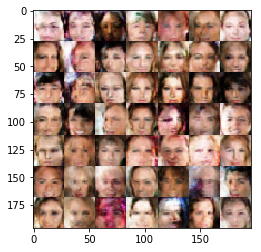

Epoch 1/1... Discriminator Loss: 0.9182... Generator Loss: 1.9521
Epoch 1/1... Discriminator Loss: 0.7332... Generator Loss: 1.3315
Epoch 1/1... Discriminator Loss: 0.6388... Generator Loss: 2.4260
Epoch 1/1... Discriminator Loss: 0.9530... Generator Loss: 2.0805
Epoch 1/1... Discriminator Loss: 1.0155... Generator Loss: 0.3898
Epoch 1/1... Discriminator Loss: 0.9355... Generator Loss: 1.3361
Epoch 1/1... Discriminator Loss: 0.8309... Generator Loss: 0.9585
Epoch 1/1... Discriminator Loss: 0.8756... Generator Loss: 0.9152
Epoch 1/1... Discriminator Loss: 0.8241... Generator Loss: 1.9947
Epoch 1/1... Discriminator Loss: 1.4176... Generator Loss: 2.1534


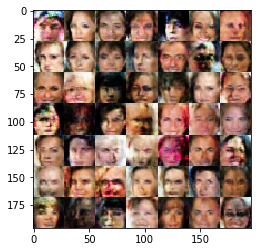

Epoch 1/1... Discriminator Loss: 0.7789... Generator Loss: 1.5333
Epoch 1/1... Discriminator Loss: 0.9180... Generator Loss: 1.6098
Epoch 1/1... Discriminator Loss: 0.7316... Generator Loss: 1.7518
Epoch 1/1... Discriminator Loss: 0.9664... Generator Loss: 1.8183
Epoch 1/1... Discriminator Loss: 0.7354... Generator Loss: 1.6301
Epoch 1/1... Discriminator Loss: 0.7692... Generator Loss: 1.6690
Epoch 1/1... Discriminator Loss: 0.7330... Generator Loss: 1.0146
Epoch 1/1... Discriminator Loss: 0.7867... Generator Loss: 1.2071
Epoch 1/1... Discriminator Loss: 1.1953... Generator Loss: 0.6043
Epoch 1/1... Discriminator Loss: 1.0893... Generator Loss: 1.7521


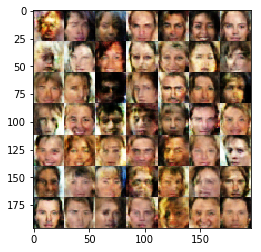

Epoch 1/1... Discriminator Loss: 1.0290... Generator Loss: 1.1261
Epoch 1/1... Discriminator Loss: 0.5892... Generator Loss: 1.3590
Epoch 1/1... Discriminator Loss: 0.8160... Generator Loss: 1.6737
Epoch 1/1... Discriminator Loss: 1.0682... Generator Loss: 0.3229
Epoch 1/1... Discriminator Loss: 0.8571... Generator Loss: 0.7129
Epoch 1/1... Discriminator Loss: 0.8589... Generator Loss: 1.2118
Epoch 1/1... Discriminator Loss: 1.2350... Generator Loss: 1.3801
Epoch 1/1... Discriminator Loss: 0.6968... Generator Loss: 2.1682
Epoch 1/1... Discriminator Loss: 0.7575... Generator Loss: 1.3328
Epoch 1/1... Discriminator Loss: 0.8874... Generator Loss: 1.4282


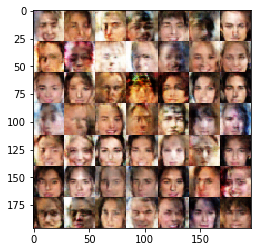

Epoch 1/1... Discriminator Loss: 1.0486... Generator Loss: 1.9339
Epoch 1/1... Discriminator Loss: 1.0061... Generator Loss: 1.2598
Epoch 1/1... Discriminator Loss: 0.7777... Generator Loss: 1.2549
Epoch 1/1... Discriminator Loss: 0.9891... Generator Loss: 1.1521
Epoch 1/1... Discriminator Loss: 0.6522... Generator Loss: 2.1904
Epoch 1/1... Discriminator Loss: 0.8066... Generator Loss: 2.0059
Epoch 1/1... Discriminator Loss: 1.0866... Generator Loss: 1.1247
Epoch 1/1... Discriminator Loss: 0.5419... Generator Loss: 1.2121
Epoch 1/1... Discriminator Loss: 1.2404... Generator Loss: 0.8039
Epoch 1/1... Discriminator Loss: 1.2924... Generator Loss: 3.2456


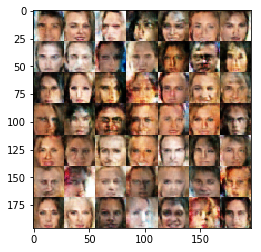

Epoch 1/1... Discriminator Loss: 0.9873... Generator Loss: 1.6206
Epoch 1/1... Discriminator Loss: 1.1340... Generator Loss: 1.1840
Epoch 1/1... Discriminator Loss: 1.5003... Generator Loss: 3.1722
Epoch 1/1... Discriminator Loss: 0.8259... Generator Loss: 1.4943
Epoch 1/1... Discriminator Loss: 0.8322... Generator Loss: 2.2588
Epoch 1/1... Discriminator Loss: 0.8390... Generator Loss: 2.4527
Epoch 1/1... Discriminator Loss: 0.8017... Generator Loss: 1.7428
Epoch 1/1... Discriminator Loss: 0.9695... Generator Loss: 0.4832
Epoch 1/1... Discriminator Loss: 0.6993... Generator Loss: 1.3396
Epoch 1/1... Discriminator Loss: 0.6370... Generator Loss: 1.9487


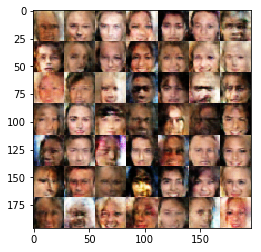

Epoch 1/1... Discriminator Loss: 0.8409... Generator Loss: 1.8828
Epoch 1/1... Discriminator Loss: 0.9342... Generator Loss: 1.6805
Epoch 1/1... Discriminator Loss: 1.4305... Generator Loss: 2.9545
Epoch 1/1... Discriminator Loss: 0.7914... Generator Loss: 1.6545
Epoch 1/1... Discriminator Loss: 1.2533... Generator Loss: 0.3527
Epoch 1/1... Discriminator Loss: 0.8905... Generator Loss: 0.9813
Epoch 1/1... Discriminator Loss: 1.3127... Generator Loss: 0.4225
Epoch 1/1... Discriminator Loss: 1.1595... Generator Loss: 0.7292
Epoch 1/1... Discriminator Loss: 0.9594... Generator Loss: 1.7978
Epoch 1/1... Discriminator Loss: 0.7473... Generator Loss: 1.4324


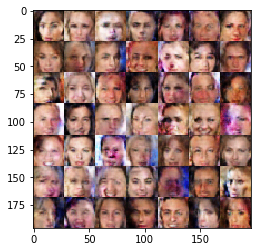

Epoch 1/1... Discriminator Loss: 0.7739... Generator Loss: 2.4747
Epoch 1/1... Discriminator Loss: 0.7319... Generator Loss: 2.0200
Epoch 1/1... Discriminator Loss: 0.8881... Generator Loss: 1.7612
Epoch 1/1... Discriminator Loss: 0.6732... Generator Loss: 2.7654
Epoch 1/1... Discriminator Loss: 0.9072... Generator Loss: 2.5018
Epoch 1/1... Discriminator Loss: 0.8538... Generator Loss: 1.7461
Epoch 1/1... Discriminator Loss: 0.9684... Generator Loss: 1.1626
Epoch 1/1... Discriminator Loss: 0.6577... Generator Loss: 1.3982
Epoch 1/1... Discriminator Loss: 0.9661... Generator Loss: 1.5457
Epoch 1/1... Discriminator Loss: 0.6164... Generator Loss: 1.6900


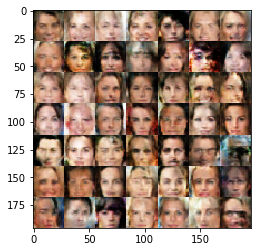

Epoch 1/1... Discriminator Loss: 0.6779... Generator Loss: 1.3194
Epoch 1/1... Discriminator Loss: 0.8874... Generator Loss: 0.8566
Epoch 1/1... Discriminator Loss: 0.8674... Generator Loss: 1.4011
Epoch 1/1... Discriminator Loss: 0.6469... Generator Loss: 1.0916
Epoch 1/1... Discriminator Loss: 0.9023... Generator Loss: 1.3175
Epoch 1/1... Discriminator Loss: 0.7940... Generator Loss: 0.7439
Epoch 1/1... Discriminator Loss: 0.5903... Generator Loss: 2.3310
Epoch 1/1... Discriminator Loss: 1.0738... Generator Loss: 0.6534
Epoch 1/1... Discriminator Loss: 0.8316... Generator Loss: 2.1329
Epoch 1/1... Discriminator Loss: 0.6345... Generator Loss: 0.8583


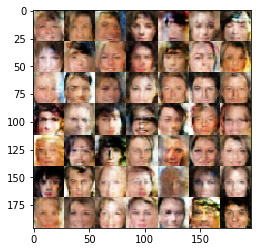

Epoch 1/1... Discriminator Loss: 1.3403... Generator Loss: 1.3139
Epoch 1/1... Discriminator Loss: 0.7516... Generator Loss: 1.1710
Epoch 1/1... Discriminator Loss: 0.8531... Generator Loss: 1.9487
Epoch 1/1... Discriminator Loss: 0.9288... Generator Loss: 1.6247
Epoch 1/1... Discriminator Loss: 1.2015... Generator Loss: 2.1571
Epoch 1/1... Discriminator Loss: 0.9055... Generator Loss: 1.2217
Epoch 1/1... Discriminator Loss: 0.7270... Generator Loss: 1.2485
Epoch 1/1... Discriminator Loss: 1.3891... Generator Loss: 1.3169
Epoch 1/1... Discriminator Loss: 0.5313... Generator Loss: 1.5644
Epoch 1/1... Discriminator Loss: 0.8036... Generator Loss: 2.3175


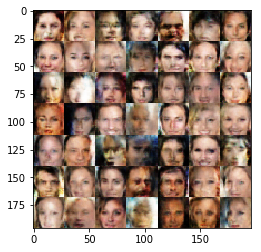

Epoch 1/1... Discriminator Loss: 0.6974... Generator Loss: 1.6752
Epoch 1/1... Discriminator Loss: 1.1703... Generator Loss: 2.0787
Epoch 1/1... Discriminator Loss: 0.9767... Generator Loss: 0.3973
Epoch 1/1... Discriminator Loss: 0.6726... Generator Loss: 2.5710
Epoch 1/1... Discriminator Loss: 0.6711... Generator Loss: 2.0742
Epoch 1/1... Discriminator Loss: 1.0249... Generator Loss: 2.2229
Epoch 1/1... Discriminator Loss: 0.7734... Generator Loss: 1.2374
Epoch 1/1... Discriminator Loss: 1.4005... Generator Loss: 0.8142
Epoch 1/1... Discriminator Loss: 0.8185... Generator Loss: 0.6406
Epoch 1/1... Discriminator Loss: 1.1446... Generator Loss: 0.5104


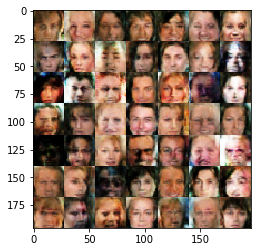

Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.7091
Epoch 1/1... Discriminator Loss: 0.6911... Generator Loss: 1.5692
Epoch 1/1... Discriminator Loss: 1.1786... Generator Loss: 2.4500
Epoch 1/1... Discriminator Loss: 0.6238... Generator Loss: 1.8733
Epoch 1/1... Discriminator Loss: 1.0673... Generator Loss: 1.1160
Epoch 1/1... Discriminator Loss: 1.0669... Generator Loss: 3.0160
Epoch 1/1... Discriminator Loss: 0.9574... Generator Loss: 2.0899
Epoch 1/1... Discriminator Loss: 0.8056... Generator Loss: 2.5254
Epoch 1/1... Discriminator Loss: 0.8913... Generator Loss: 1.1915
Epoch 1/1... Discriminator Loss: 1.3923... Generator Loss: 0.5482


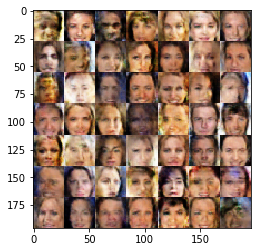

Epoch 1/1... Discriminator Loss: 0.8807... Generator Loss: 1.6424
Epoch 1/1... Discriminator Loss: 1.0474... Generator Loss: 2.5775
Epoch 1/1... Discriminator Loss: 1.0295... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 0.8543... Generator Loss: 2.5673
Epoch 1/1... Discriminator Loss: 0.8594... Generator Loss: 1.1204
Epoch 1/1... Discriminator Loss: 1.1288... Generator Loss: 1.3939
Epoch 1/1... Discriminator Loss: 0.7971... Generator Loss: 1.2605
Epoch 1/1... Discriminator Loss: 1.2114... Generator Loss: 0.9194
Epoch 1/1... Discriminator Loss: 0.8466... Generator Loss: 1.3574
Epoch 1/1... Discriminator Loss: 0.9247... Generator Loss: 0.6099


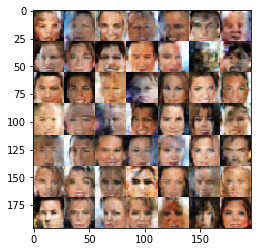

Epoch 1/1... Discriminator Loss: 0.7201... Generator Loss: 1.8571
Epoch 1/1... Discriminator Loss: 1.0262... Generator Loss: 2.9678
Epoch 1/1... Discriminator Loss: 0.6602... Generator Loss: 1.1872
Epoch 1/1... Discriminator Loss: 1.2898... Generator Loss: 0.4963
Epoch 1/1... Discriminator Loss: 0.7823... Generator Loss: 1.7418
Epoch 1/1... Discriminator Loss: 1.0131... Generator Loss: 1.5184
Epoch 1/1... Discriminator Loss: 0.6916... Generator Loss: 1.5594
Epoch 1/1... Discriminator Loss: 0.7298... Generator Loss: 1.0576
Epoch 1/1... Discriminator Loss: 0.9898... Generator Loss: 1.1775
Epoch 1/1... Discriminator Loss: 0.7859... Generator Loss: 1.7214


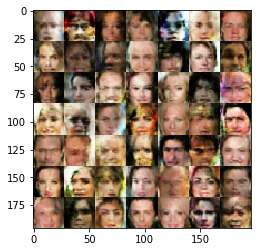

Epoch 1/1... Discriminator Loss: 1.0587... Generator Loss: 2.4653
Epoch 1/1... Discriminator Loss: 0.5778... Generator Loss: 1.8877
Epoch 1/1... Discriminator Loss: 0.6880... Generator Loss: 1.1892
Epoch 1/1... Discriminator Loss: 0.8418... Generator Loss: 1.0068
Epoch 1/1... Discriminator Loss: 0.8787... Generator Loss: 2.8955
Epoch 1/1... Discriminator Loss: 1.1217... Generator Loss: 1.4051
Epoch 1/1... Discriminator Loss: 1.3362... Generator Loss: 1.9262
Epoch 1/1... Discriminator Loss: 0.9513... Generator Loss: 0.8414
Epoch 1/1... Discriminator Loss: 1.5046... Generator Loss: 1.3808
Epoch 1/1... Discriminator Loss: 0.9370... Generator Loss: 1.5087


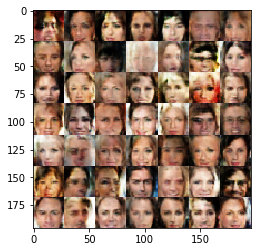

Epoch 1/1... Discriminator Loss: 0.8374... Generator Loss: 2.1565
Epoch 1/1... Discriminator Loss: 1.3073... Generator Loss: 1.3648
Epoch 1/1... Discriminator Loss: 0.9672... Generator Loss: 1.0507
Epoch 1/1... Discriminator Loss: 0.7355... Generator Loss: 0.9978
Epoch 1/1... Discriminator Loss: 0.9121... Generator Loss: 1.2461
Epoch 1/1... Discriminator Loss: 1.0904... Generator Loss: 0.8065
Epoch 1/1... Discriminator Loss: 0.9920... Generator Loss: 2.3248
Epoch 1/1... Discriminator Loss: 0.9930... Generator Loss: 1.4919
Epoch 1/1... Discriminator Loss: 1.2364... Generator Loss: 1.5371
Epoch 1/1... Discriminator Loss: 0.5665... Generator Loss: 1.6868


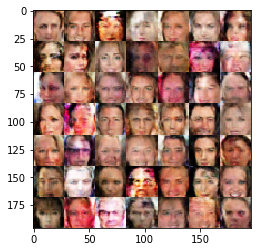

Epoch 1/1... Discriminator Loss: 0.5594... Generator Loss: 1.5952
Epoch 1/1... Discriminator Loss: 1.3971... Generator Loss: 0.3987
Epoch 1/1... Discriminator Loss: 1.0606... Generator Loss: 0.9106


In [213]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.